In [2]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', None)

In [3]:
# File path
file_path1 = '/Volumes/T7/Solar_uptake_data/sgu-solar-capacity-2001-to-2010.csv'

file_path2 = '/Volumes/T7/Solar_uptake_data/sgu-solar-capacity-2011-to-present.csv'

df1 = pd.read_csv(file_path1)  # 2001-2010 data
df2 = pd.read_csv(file_path2)  # 2011-present data

# Merge the dataframes based on postcode
# Using outer join to keep all postcodes from both datasets
solar_data = pd.merge(df1, df2, 
                    left_on='Small Unit Installation Postcode',
                    right_on='Small Unit Postcode',
                    how='outer')

In [4]:
solar_data.head()

,Small Unit Installation Postcode,Apr 2001 - SGU Rated Output In kW,May 2001 - SGU Rated Output In kW,Jun 2001 - SGU Rated Output In kW,Jul 2001 - SGU Rated Output In kW,Aug 2001 - SGU Rated Output In kW,Sep 2001 - SGU Rated Output In kW,Oct 2001 - SGU Rated Output In kW,Nov 2001 - SGU Rated Output In kW,Dec 2001 - SGU Rated Output In kW,Jan 2002 - SGU Rated Output In kW,Feb 2002 - SGU Rated Output In kW,Mar 2002 - SGU Rated Output In kW,Apr 2002 - SGU Rated Output In kW,May 2002 - SGU Rated Output In kW,Jun 2002 - SGU Rated Output In kW,Jul 2002 - SGU Rated Output In kW,Aug 2002 - SGU Rated Output In kW,Sep 2002 - SGU Rated Output In kW,Oct 2002 - SGU Rated Output In kW,Nov 2002 - SGU Rated Output In kW,Dec 2002 - SGU Rated Output In kW,Jan 2003 - SGU Rated Output In kW,Feb 2003 - SGU Rated Output In kW,Mar 2003 - SGU Rated Output In kW,Apr 2003 - SGU Rated Output In kW,May 2003 - SGU Rated Output In kW,Jun 2003 - SGU Rated Output In kW,Jul 2003 - SGU Rated Output In kW,Aug 2003 - SGU Rated Output In kW,Sep 2003 - SGU Rated Output In kW,Oct 2003 - SGU Rated Output In kW,Nov 2003 - SGU Rated Output In kW,Dec 2003 - SGU Rated Output In kW,Jan 2004 - SGU Rated Output In kW,Feb 2004 - SGU Rated Output In kW,Mar 2004 - SGU Rated Output In kW,Apr 2004 - SGU Rated Output In kW,May 2004 - SGU Rated Output In kW,Jun 2004 - SGU Rated Output In kW,Jul 2004 - SGU Rated Output In kW,Aug 2004 - SGU Rated Output In kW,Sep 2004 - SGU Rated Output In kW,Oct 2004 - SGU Rated Output In kW,Nov 2004 - SGU Rated Output In kW,Dec 2004 - SGU Rated Output In kW,Jan 2005 - SGU Rated Output In kW,Feb 2005 - SGU Rated Output In kW,Mar 2005 - SGU Rated Output In kW,Apr 2005 - SGU Rated Output In kW,May 2005 - SGU Rated Output In kW,Jun 2005 - SGU Rated Output In kW,Jul 2005 - SGU Rated Output In kW,Aug 2005 - SGU Rated Output In kW,Sep 2005 - SGU Rated Output In kW,Oct 2005 - SGU Rated Output In kW,Nov 2005 - SGU Rated Output In kW,Dec 2005 - SGU Rated Output In kW,Jan 2006 - SGU Rated Output In kW,Feb 2006 - SGU Rated Output In kW,Mar 2006 - SGU Rated Output In kW,Apr 2006 - SGU Rated Output In kW,May 2006 - SGU Rated Output In kW,Jun 2006 - SGU Rated Output In kW,Jul 2006 - SGU Rated Output In kW,Aug 2006 - SGU Rated Output In kW,Sep 2006 - SGU Rated Output In kW,Oct 2006 - SGU Rated Output In kW,Nov 2006 - SGU Rated Output In kW,Dec 2006 - SGU Rated Output In kW,Jan 2007 - SGU Rated Output In kW,Feb 2007 - SGU Rated Output In kW,Mar 2007 - SGU Rated Output In kW,Apr 2007 - SGU Rated Output In kW,May 2007 - SGU Rated Output In kW,Jun 2007 - SGU Rated Output In kW,Jul 2007 - SGU Rated Output In kW,Aug 2007 - SGU Rated Output In kW,Sep 2007 - SGU Rated Output In kW,Oct 2007 - SGU Rated Output In kW,Nov 2007 - SGU Rated Output In kW,Dec 2007 - SGU Rated Output In kW,Jan 2008 - SGU Rated Output In kW,Feb 2008 - SGU Rated Output In kW,Mar 2008 - SGU Rated Output In kW,Apr 2008 - SGU Rated Output In kW,May 2008 - SGU Rated Output In kW,Jun 2008 - SGU Rated Output In kW,Jul 2008 - SGU Rated Output In kW,Aug 2008 - SGU Rated Output In kW,Sep 2008 - SGU Rated Output In kW,Oct 2008 - SGU Rated Output In kW,Nov 2008 - SGU Rated Output In kW,Dec 2008 - SGU Rated Output In kW,Jan 2009 - SGU Rated Output In kW,Feb 2009 - SGU Rated Output In kW,Mar 2009 - SGU Rated Output In kW,Apr 2009 - SGU Rated Output In kW,May 2009 - SGU Rated Output In kW,Jun 2009 - SGU Rated Output In kW,Jul 2009 - SGU Rated Output In kW,Aug 2009 - SGU Rated Output In kW,Sep 2009 - SGU Rated Output In kW,Oct 2009 - SGU Rated Output In kW,Nov 2009 - SGU Rated Output In kW,Dec 2009 - SGU Rated Output In kW,Jan 2010 - SGU Rated Output In kW,Feb 2010 - SGU Rated Output In kW,Mar 2010 - SGU Rated Output In kW,Apr 2010 - SGU Rated Output In kW,May 2010 - SGU Rated Output In kW,Jun 2010 - SGU Rated Output In kW,Jul 2010 - SGU Rated Output In kW,Aug 2010 - SGU Rated Output In kW,Sep 2010 - SGU Rated Output In kW,Oct 2010 - SGU Rated Output In kW,Nov 2010 - SGU Rated Output In kW,Dec 2010 - SGU Rated O

In [5]:
# Calculate cumulative sum across columns (excluding postcode column)
# First get all columns except postcode
capacity_columns = [col for col in solar_data.columns if 'kW' in col]

# Create new DataFrame with cumulative sums
cumulative_df = solar_data.copy()
cumulative_df[capacity_columns] = solar_data[capacity_columns].cumsum(axis=1)

# To verify it worked:
print("First few rows of cumulative capacity:")
cumulative_df.head()

First few rows of cumulative capacity:


,Small Unit Installation Postcode,Apr 2001 - SGU Rated Output In kW,May 2001 - SGU Rated Output In kW,Jun 2001 - SGU Rated Output In kW,Jul 2001 - SGU Rated Output In kW,Aug 2001 - SGU Rated Output In kW,Sep 2001 - SGU Rated Output In kW,Oct 2001 - SGU Rated Output In kW,Nov 2001 - SGU Rated Output In kW,Dec 2001 - SGU Rated Output In kW,Jan 2002 - SGU Rated Output In kW,Feb 2002 - SGU Rated Output In kW,Mar 2002 - SGU Rated Output In kW,Apr 2002 - SGU Rated Output In kW,May 2002 - SGU Rated Output In kW,Jun 2002 - SGU Rated Output In kW,Jul 2002 - SGU Rated Output In kW,Aug 2002 - SGU Rated Output In kW,Sep 2002 - SGU Rated Output In kW,Oct 2002 - SGU Rated Output In kW,Nov 2002 - SGU Rated Output In kW,Dec 2002 - SGU Rated Output In kW,Jan 2003 - SGU Rated Output In kW,Feb 2003 - SGU Rated Output In kW,Mar 2003 - SGU Rated Output In kW,Apr 2003 - SGU Rated Output In kW,May 2003 - SGU Rated Output In kW,Jun 2003 - SGU Rated Output In kW,Jul 2003 - SGU Rated Output In kW,Aug 2003 - SGU Rated Output In kW,Sep 2003 - SGU Rated Output In kW,Oct 2003 - SGU Rated Output In kW,Nov 2003 - SGU Rated Output In kW,Dec 2003 - SGU Rated Output In kW,Jan 2004 - SGU Rated Output In kW,Feb 2004 - SGU Rated Output In kW,Mar 2004 - SGU Rated Output In kW,Apr 2004 - SGU Rated Output In kW,May 2004 - SGU Rated Output In kW,Jun 2004 - SGU Rated Output In kW,Jul 2004 - SGU Rated Output In kW,Aug 2004 - SGU Rated Output In kW,Sep 2004 - SGU Rated Output In kW,Oct 2004 - SGU Rated Output In kW,Nov 2004 - SGU Rated Output In kW,Dec 2004 - SGU Rated Output In kW,Jan 2005 - SGU Rated Output In kW,Feb 2005 - SGU Rated Output In kW,Mar 2005 - SGU Rated Output In kW,Apr 2005 - SGU Rated Output In kW,May 2005 - SGU Rated Output In kW,Jun 2005 - SGU Rated Output In kW,Jul 2005 - SGU Rated Output In kW,Aug 2005 - SGU Rated Output In kW,Sep 2005 - SGU Rated Output In kW,Oct 2005 - SGU Rated Output In kW,Nov 2005 - SGU Rated Output In kW,Dec 2005 - SGU Rated Output In kW,Jan 2006 - SGU Rated Output In kW,Feb 2006 - SGU Rated Output In kW,Mar 2006 - SGU Rated Output In kW,Apr 2006 - SGU Rated Output In kW,May 2006 - SGU Rated Output In kW,Jun 2006 - SGU Rated Output In kW,Jul 2006 - SGU Rated Output In kW,Aug 2006 - SGU Rated Output In kW,Sep 2006 - SGU Rated Output In kW,Oct 2006 - SGU Rated Output In kW,Nov 2006 - SGU Rated Output In kW,Dec 2006 - SGU Rated Output In kW,Jan 2007 - SGU Rated Output In kW,Feb 2007 - SGU Rated Output In kW,Mar 2007 - SGU Rated Output In kW,Apr 2007 - SGU Rated Output In kW,May 2007 - SGU Rated Output In kW,Jun 2007 - SGU Rated Output In kW,Jul 2007 - SGU Rated Output In kW,Aug 2007 - SGU Rated Output In kW,Sep 2007 - SGU Rated Output In kW,Oct 2007 - SGU Rated Output In kW,Nov 2007 - SGU Rated Output In kW,Dec 2007 - SGU Rated Output In kW,Jan 2008 - SGU Rated Output In kW,Feb 2008 - SGU Rated Output In kW,Mar 2008 - SGU Rated Output In kW,Apr 2008 - SGU Rated Output In kW,May 2008 - SGU Rated Output In kW,Jun 2008 - SGU Rated Output In kW,Jul 2008 - SGU Rated Output In kW,Aug 2008 - SGU Rated Output In kW,Sep 2008 - SGU Rated Output In kW,Oct 2008 - SGU Rated Output In kW,Nov 2008 - SGU Rated Output In kW,Dec 2008 - SGU Rated Output In kW,Jan 2009 - SGU Rated Output In kW,Feb 2009 - SGU Rated Output In kW,Mar 2009 - SGU Rated Output In kW,Apr 2009 - SGU Rated Output In kW,May 2009 - SGU Rated Output In kW,Jun 2009 - SGU Rated Output In kW,Jul 2009 - SGU Rated Output In kW,Aug 2009 - SGU Rated Output In kW,Sep 2009 - SGU Rated Output In kW,Oct 2009 - SGU Rated Output In kW,Nov 2009 - SGU Rated Output In kW,Dec 2009 - SGU Rated Output In kW,Jan 2010 - SGU Rated Output In kW,Feb 2010 - SGU Rated Output In kW,Mar 2010 - SGU Rated Output In kW,Apr 2010 - SGU Rated Output In kW,May 2010 - SGU Rated Output In kW,Jun 2010 - SGU Rated Output In kW,Jul 2010 - SGU Rated Output In kW,Aug 2010 - SGU Rated Output In kW,Sep 2010 - SGU Rated Output In kW,Oct 2010 - SGU Rated Output In kW,Nov 2010 - SGU Rated Output In kW,Dec 2010 - SGU Rated O

In [6]:
# First, let's get our x-axis (dates) and make them datetime
capacity_columns = [col for col in cumulative_df.columns if 'kW' in col]
dates = pd.to_datetime([col.split(' - ')[0] for col in capacity_columns])

# Create a figure with appropriate size
plt.figure(figsize=(15, 10))

# Plot each postcode's cumulative capacity
for index, row in cumulative_df.iterrows():
    postcode = row['Small Unit Installation Postcode']
    values = row[capacity_columns]
    plt.plot(dates, values, label=f'Postcode {postcode}')

# Customize the plot
plt.title('Cumulative Solar Capacity by Postcode Over Time')
plt.xlabel('Date')
plt.ylabel('Cumulative Capacity (kW)')
plt.grid(True)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Add legend (might be crowded with many postcodes)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Show the plot
plt.show()

/var/folders/xw/3fpv2dn948lcf41k_wd6vbxh0000gn/T/ipykernel_47360/1072129179.py:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  dates = pd.to_datetime([col.split(' - ')[0] for col in capacity_columns])
/var/folders/xw/3fpv2dn948lcf41k_wd6vbxh0000gn/T/ipykernel_47360/1072129179.py:27: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


/var/folders/xw/3fpv2dn948lcf41k_wd6vbxh0000gn/T/ipykernel_47360/461313996.py:8: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  'Date': pd.to_datetime([col.split(' - ')[0] for col in capacity_columns])


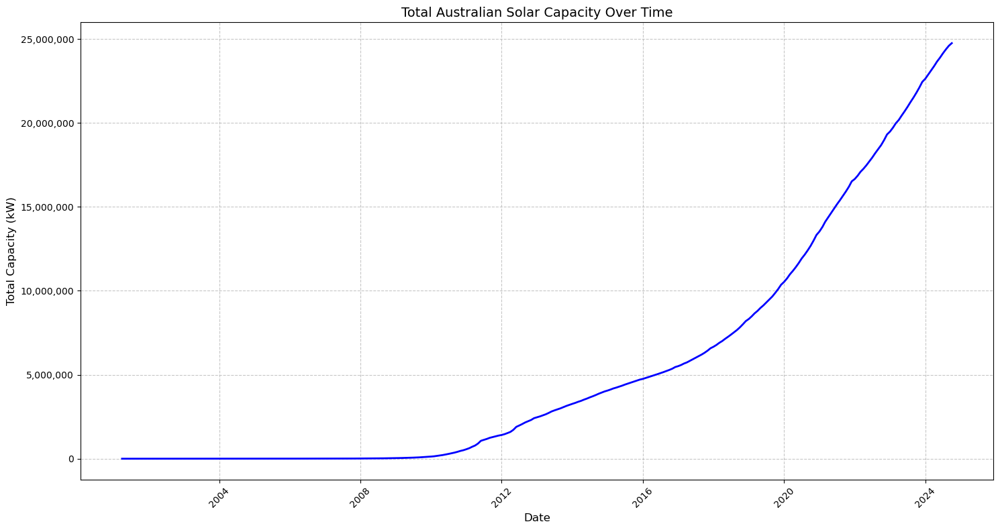

Current total Australian capacity: 24,751,031.38 kW


In [7]:
# Create a new DataFrame with just the total Australian capacity
# Sum all postcodes for each month
total_capacity = cumulative_df[capacity_columns].sum()

# Convert the series to a DataFrame with dates as index
aus_total_df = pd.DataFrame({
    'Total_Capacity': total_capacity,
    'Date': pd.to_datetime([col.split(' - ')[0] for col in capacity_columns])
}).set_index('Date')

# Create the line plot
plt.figure(figsize=(15, 8))
plt.plot(aus_total_df.index, aus_total_df['Total_Capacity'], 
         linewidth=2, color='blue')

# Customize the plot
plt.title('Total Australian Solar Capacity Over Time', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Total Capacity (kW)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)

# Rotate x-axis labels
plt.xticks(rotation=45)

# Add commas to y-axis for better readability
plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: format(int(x), ',')))

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

# Print total current capacity
print(f"Current total Australian capacity: {aus_total_df['Total_Capacity'].iloc[-1]:,.2f} kW")

In [8]:
# Load the postcode shapefile
# Path to the .shp file
shapefile_path = '/Volumes/T7/POA_2021_AUST_GDA2020_SHP'

postcode_shapes = gpd.read_file(shapefile_path)

print(postcode_shapes.columns)

postcode_shapes

Index(['POA_CODE21', 'POA_NAME21', 'AUS_CODE21', 'AUS_NAME21', 'AREASQKM21',
       'LOCI_URI21', 'SHAPE_Leng', 'SHAPE_Area', 'geometry'],
      dtype='object')


,POA_CODE21,POA_NAME21,AUS_CODE21,AUS_NAME21,AREASQKM21,LOCI_URI21,SHAPE_Leng,SHAPE_Area,geometry
0,0800,0800,AUS,Australia,3.1731,http://linked.data.gov.au/dataset/asgsed3/POA/...,0.081893,0.000264,"POLYGON ((130.83681 -12.45376, 130.83684 -12.4..."
1,0810,0810,AUS,Australia,24.4283,http://linked.data.gov.au/dataset/asgsed3/POA/...,0.241859,0.002031,"POLYGON ((130.89986 -12.36567, 130.89875 -12.3..."
2,0812,0812,AUS,Australia,35.8899,http://linked.data.gov.au/dataset/asgsed3/POA/...,0.278788,0.002983,"POLYGON ((130.91915 -12.40786, 130.91831 -12.4..."
3,0820,0820,AUS,Australia,39.0642,http://linked.data.gov.au/dataset/asgsed3/POA/...,0.409134,0.003248,"POLYGON ((130.8526 -12.43994, 130.85089 -12.43..."
4,0822,0822,AUS,Australia,150775.8030,http://linked.data.gov.au/dataset/asgsed3/POA/...,90.601831,12.564238,"MULTIPOLYGON (((136.56648 -12.08392, 136.56704..."
...,...,...,...,...,...,...,...,...,...
2639,7469,7469,AUS,Australia,5893.5125,http://linked.data.gov.au/dataset/asgsed3/POA/...,11.341555,0.636169,"MULTIPOLYGON (((144.79215 -41.46478, 144.79212..."
2640,7470,7470,AUS,Australia,108.2441,http://linked.data.gov.au/dataset/asgsed3/POA/...,0.781048,0.011725,"POLYGON ((145.57769 -41.7864, 145.57686 -41.78..."
2641,9494,No usual address (Aust.),AUS,Australia,0.0000,http://linked.data.gov.au/dataset/asgsed3/POA/...,0.000000,0.000000,None
2642,9797,Migratory - Offshore - Shipping (Aust.),AUS,Australia,0.0000,http://linked.data.gov.au/dataset/asgsed3/POA/...,0.000000,0.000000,None


In [9]:
# Ensure both columns are strings
print(cumulative_df['Small Unit Postcode'].dtype)

cumulative_df['Small Unit Postcode'] = (
    pd.to_numeric(cumulative_df['Small Unit Postcode'], errors='coerce')  # Convert to numeric; unconvertible values become NaN
    .fillna(0)            # Replace NaN values with 0 (or another value if desired)
    .astype(int)          # Convert to int (this drops the decimal part)
    .astype(str)          # Finally, convert the ints to strings
)

print(cumulative_df['Small Unit Postcode'])

float64
0         0
1       200
2       800
3       801
4       803
       ... 
2826      0
2827      0
2828      0
2829      0
2830      0
Name: Small Unit Postcode, Length: 2831, dtype: object


In [10]:
# Merge the data
merged_data = postcode_shapes.merge(cumulative_df, left_on='POA_CODE21', right_on='Small Unit Postcode')

merged_data

,POA_CODE21,POA_NAME21,AUS_CODE21,AUS_NAME21,AREASQKM21,LOCI_URI21,SHAPE_Leng,SHAPE_Area,geometry,Small Unit Installation Postcode,Apr 2001 - SGU Rated Output In kW,May 2001 - SGU Rated Output In kW,Jun 2001 - SGU Rated Output In kW,Jul 2001 - SGU Rated Output In kW,Aug 2001 - SGU Rated Output In kW,Sep 2001 - SGU Rated Output In kW,Oct 2001 - SGU Rated Output In kW,Nov 2001 - SGU Rated Output In kW,Dec 2001 - SGU Rated Output In kW,Jan 2002 - SGU Rated Output In kW,Feb 2002 - SGU Rated Output In kW,Mar 2002 - SGU Rated Output In kW,Apr 2002 - SGU Rated Output In kW,May 2002 - SGU Rated Output In kW,Jun 2002 - SGU Rated Output In kW,Jul 2002 - SGU Rated Output In kW,Aug 2002 - SGU Rated Output In kW,Sep 2002 - SGU Rated Output In kW,Oct 2002 - SGU Rated Output In kW,Nov 2002 - SGU Rated Output In kW,Dec 2002 - SGU Rated Output In kW,Jan 2003 - SGU Rated Output In kW,Feb 2003 - SGU Rated Output In kW,Mar 2003 - SGU Rated Output In kW,Apr 2003 - SGU Rated Output In kW,May 2003 - SGU Rated Output In kW,Jun 2003 - SGU Rated Output In kW,Jul 2003 - SGU Rated Output In kW,Aug 2003 - SGU Rated Output In kW,Sep 2003 - SGU Rated Output In kW,Oct 2003 - SGU Rated Output In kW,Nov 2003 - SGU Rated Output In kW,Dec 2003 - SGU Rated Output In kW,Jan 2004 - SGU Rated Output In kW,Feb 2004 - SGU Rated Output In kW,Mar 2004 - SGU Rated Output In kW,Apr 2004 - SGU Rated Output In kW,May 2004 - SGU Rated Output In kW,Jun 2004 - SGU Rated Output In kW,Jul 2004 - SGU Rated Output In kW,Aug 2004 - SGU Rated Output In kW,Sep 2004 - SGU Rated Output In kW,Oct 2004 - SGU Rated Output In kW,Nov 2004 - SGU Rated Output In kW,Dec 2004 - SGU Rated Output In kW,Jan 2005 - SGU Rated Output In kW,Feb 2005 - SGU Rated Output In kW,Mar 2005 - SGU Rated Output In kW,Apr 2005 - SGU Rated Output In kW,May 2005 - SGU Rated Output In kW,Jun 2005 - SGU Rated Output In kW,Jul 2005 - SGU Rated Output In kW,Aug 2005 - SGU Rated Output In kW,Sep 2005 - SGU Rated Output In kW,Oct 2005 - SGU Rated Output In kW,Nov 2005 - SGU Rated Output In kW,Dec 2005 - SGU Rated Output In kW,Jan 2006 - SGU Rated Output In kW,Feb 2006 - SGU Rated Output In kW,Mar 2006 - SGU Rated Output In kW,Apr 2006 - SGU Rated Output In kW,May 2006 - SGU Rated Output In kW,Jun 2006 - SGU Rated Output In kW,Jul 2006 - SGU Rated Output In kW,Aug 2006 - SGU Rated Output In kW,Sep 2006 - SGU Rated Output In kW,Oct 2006 - SGU Rated Output In kW,Nov 2006 - SGU Rated Output In kW,Dec 2006 - SGU Rated Output In kW,Jan 2007 - SGU Rated Output In kW,Feb 2007 - SGU Rated Output In kW,Mar 2007 - SGU Rated Output In kW,Apr 2007 - SGU Rated Output In kW,May 2007 - SGU Rated Output In kW,Jun 2007 - SGU Rated Output In kW,Jul 2007 - SGU Rated Output In kW,Aug 2007 - SGU Rated Output In kW,Sep 2007 - SGU Rated Output In kW,Oct 2007 - SGU Rated Output In kW,Nov 2007 - SGU Rated Output In kW,Dec 2007 - SGU Rated Output In kW,Jan 2008 - SGU Rated Output In kW,Feb 2008 - SGU Rated Output In kW,Mar 2008 - SGU Rated Output In kW,Apr 2008 - SGU Rated Output In kW,May 2008 - SGU Rated Output In kW,Jun 2008 - SGU Rated Output In kW,Jul 2008 - SGU Rated Output In kW,Aug 2008 - SGU Rated Output In kW,Sep 2008 - SGU Rated Output In kW,Oct 2008 - SGU Rated Output In kW,Nov 2008 - SGU Rated Output In kW,Dec 2008 - SGU Rated Output In kW,Jan 2009 - SGU Rated Output In kW,Feb 2009 - SGU Rated Output In kW,Mar 2009 - SGU Rated Output In kW,Apr 2009 - SGU Rated Output In kW,May 2009 - SGU Rated Output In kW,Jun 2009 - SGU Rated Output In kW,Jul 2009 - SGU Rated Output In kW,Aug 2009 - SGU Rated Output In kW,Sep 2009 - SGU Rated Output In kW,Oct 2009 - SGU Rated Output In kW,Nov 2009 - SGU Rated Output In kW,Dec 2009 - SGU Rated Output In kW,Jan 2010 - SGU Rated Output In kW,Feb 2010 - SGU Rated Output In kW,Mar 2010 - SGU Rated Output In kW,Apr 2010 - SGU Rated Output In kW,May 2010 - SGU Rated Output In kW,Jun 2010 - SGU Rated Output In kW,Jul 2010 - SGU Rated Output In kW,Aug 2010 - SGU Rated Output In kW,Sep 2010 - SGU Rated Output

In [11]:
import re
import pandas as pd

# Define a pattern to match columns like "Apr 2001 - SGU Rated Output In kW"
month_pattern = r'(Jan|Feb|Mar|Apr|May|Jun|Jul|Aug|Sep|Oct|Nov|Dec)\s+\d{4}'

# Extract columns that match the month pattern
month_columns = [col for col in merged_data.columns if re.search(month_pattern, col)]

# Function to extract the date from a column name and convert it to a datetime object
def get_column_date(col):
    match = re.search(month_pattern, col)
    return pd.to_datetime(match.group(), format='%b %Y')

# Sort the month columns chronologically
month_columns_sorted = sorted(month_columns, key=get_column_date)

In [12]:
# Fill missing values with 0 in all monthly columns
merged_data[month_columns_sorted] = merged_data[month_columns_sorted].fillna(0)

# Calculate the global minimum and maximum across all monthly columns
vmin = merged_data[month_columns_sorted] .min().min()
vmax = merged_data[month_columns_sorted].max().max()

In [13]:
first_month = month_columns_sorted[0]
last_month = month_columns_sorted[-1]
print(first_month)
print(last_month)

Apr 2001 - SGU Rated Output In kW
Oct 2024 - SGU Rated Output in kW


In [14]:
# Extract the date string from the first and last month columns
date_str_first = ' '.join(re.search(month_pattern, first_month).group().split())
date_str_last  = ' '.join(re.search(month_pattern, last_month).group().split())
print(date_str_first)
print(date_str_last)

Apr 2001
Oct 2024


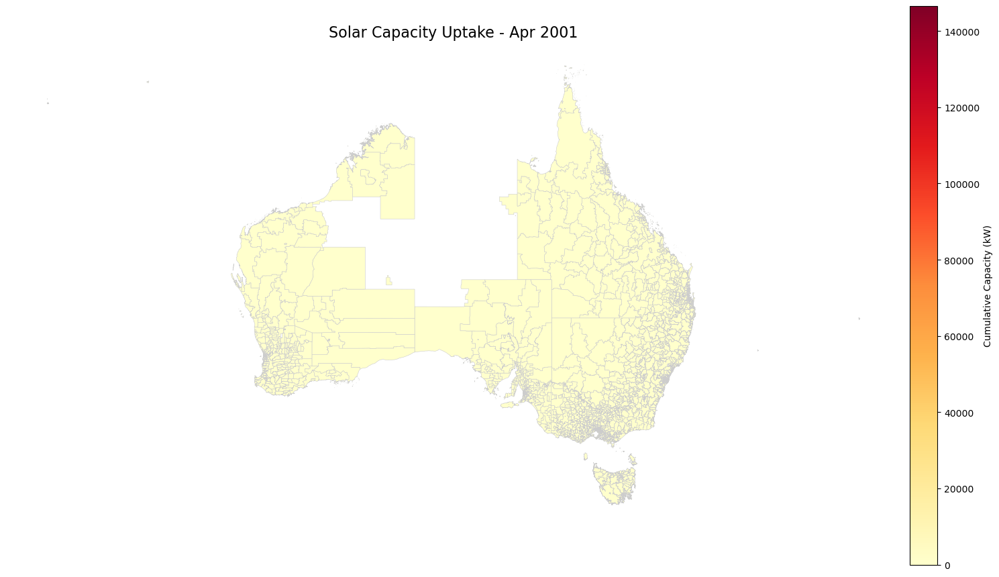

In [15]:
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

# Plot for the first month
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
merged_data.plot(
    column=first_month,
    cmap='YlOrRd',
    linewidth=0.4,
    edgecolor='0.8',
    ax=ax,
    vmin=vmin,
    vmax=vmax,
    missing_kwds={'color': 'lightgrey'}
)
ax.set_title(f'Solar Capacity Uptake - {date_str_first}', fontsize=16)
ax.axis('off')
# Optional: add a colorbar
norm = Normalize(vmin=vmin, vmax=vmax)
fig.colorbar(
    ScalarMappable(norm=norm, cmap='YlOrRd'),
    ax=ax,
    orientation='vertical',
    fraction=0.03,
    pad=0.01,
    label='Cumulative Capacity (kW)'
)
plt.tight_layout()
plt.show()

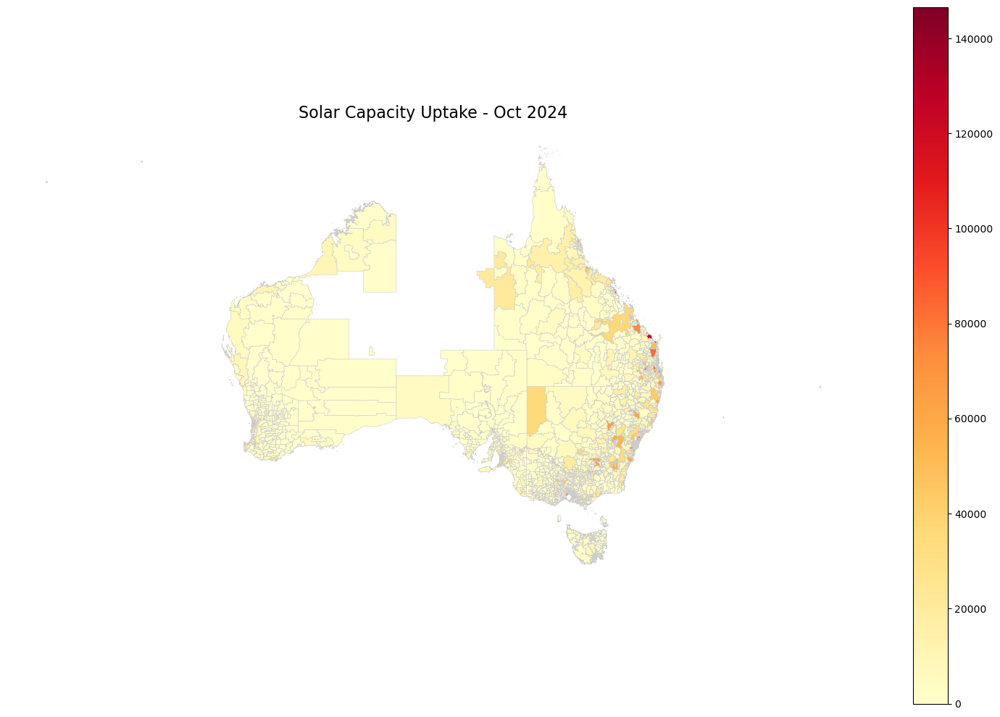

In [16]:
# Plot for the last month
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
merged_data.plot(
    column=last_month,
    cmap='YlOrRd',
    linewidth=0.4,
    edgecolor='0.8',
    legend=True,
    ax=ax,
    vmin=vmin,
    vmax=vmax,
    missing_kwds={'color': 'lightgrey'}
)
ax.set_title(f'Solar Capacity Uptake - {date_str_last}', fontsize=16)
ax.axis('off')
# Optional: add a colorbar
'''norm = Normalize(vmin=vmin, vmax=vmax)
fig.colorbar(
    ScalarMappable(norm=norm, cmap='YlOrRd'),
    ax=ax,
    orientation='vertical',
    fraction=0.03,
    pad=0.01,
    label='Cumulative Capacity (kW)'
)'''
plt.tight_layout()
plt.show()

In [17]:
import re
import numpy as np
import pandas as pd

# 1. Identify the columns that hold monthly capacity values
month_pattern = r'(Jan|Feb|Mar|Apr|May|Jun|Jul|Aug|Sep|Oct|Nov|Dec)\s+\d{4}'
month_columns = [
    col for col in merged_data.columns 
    if re.search(month_pattern, col)
]

# 2. Create a copy of merged_data
merged_data_log = merged_data.copy()

# 3. Replace NaN with 0, then apply a log transform:
#    np.log1p(x) = log(1 + x) helps avoid errors where x=0
merged_data_log[month_columns] = (
    merged_data_log[month_columns]
        .fillna(0)
        .apply(np.log1p)
)

merged_data_log

,POA_CODE21,POA_NAME21,AUS_CODE21,AUS_NAME21,AREASQKM21,LOCI_URI21,SHAPE_Leng,SHAPE_Area,geometry,Small Unit Installation Postcode,Apr 2001 - SGU Rated Output In kW,May 2001 - SGU Rated Output In kW,Jun 2001 - SGU Rated Output In kW,Jul 2001 - SGU Rated Output In kW,Aug 2001 - SGU Rated Output In kW,Sep 2001 - SGU Rated Output In kW,Oct 2001 - SGU Rated Output In kW,Nov 2001 - SGU Rated Output In kW,Dec 2001 - SGU Rated Output In kW,Jan 2002 - SGU Rated Output In kW,Feb 2002 - SGU Rated Output In kW,Mar 2002 - SGU Rated Output In kW,Apr 2002 - SGU Rated Output In kW,May 2002 - SGU Rated Output In kW,Jun 2002 - SGU Rated Output In kW,Jul 2002 - SGU Rated Output In kW,Aug 2002 - SGU Rated Output In kW,Sep 2002 - SGU Rated Output In kW,Oct 2002 - SGU Rated Output In kW,Nov 2002 - SGU Rated Output In kW,Dec 2002 - SGU Rated Output In kW,Jan 2003 - SGU Rated Output In kW,Feb 2003 - SGU Rated Output In kW,Mar 2003 - SGU Rated Output In kW,Apr 2003 - SGU Rated Output In kW,May 2003 - SGU Rated Output In kW,Jun 2003 - SGU Rated Output In kW,Jul 2003 - SGU Rated Output In kW,Aug 2003 - SGU Rated Output In kW,Sep 2003 - SGU Rated Output In kW,Oct 2003 - SGU Rated Output In kW,Nov 2003 - SGU Rated Output In kW,Dec 2003 - SGU Rated Output In kW,Jan 2004 - SGU Rated Output In kW,Feb 2004 - SGU Rated Output In kW,Mar 2004 - SGU Rated Output In kW,Apr 2004 - SGU Rated Output In kW,May 2004 - SGU Rated Output In kW,Jun 2004 - SGU Rated Output In kW,Jul 2004 - SGU Rated Output In kW,Aug 2004 - SGU Rated Output In kW,Sep 2004 - SGU Rated Output In kW,Oct 2004 - SGU Rated Output In kW,Nov 2004 - SGU Rated Output In kW,Dec 2004 - SGU Rated Output In kW,Jan 2005 - SGU Rated Output In kW,Feb 2005 - SGU Rated Output In kW,Mar 2005 - SGU Rated Output In kW,Apr 2005 - SGU Rated Output In kW,May 2005 - SGU Rated Output In kW,Jun 2005 - SGU Rated Output In kW,Jul 2005 - SGU Rated Output In kW,Aug 2005 - SGU Rated Output In kW,Sep 2005 - SGU Rated Output In kW,Oct 2005 - SGU Rated Output In kW,Nov 2005 - SGU Rated Output In kW,Dec 2005 - SGU Rated Output In kW,Jan 2006 - SGU Rated Output In kW,Feb 2006 - SGU Rated Output In kW,Mar 2006 - SGU Rated Output In kW,Apr 2006 - SGU Rated Output In kW,May 2006 - SGU Rated Output In kW,Jun 2006 - SGU Rated Output In kW,Jul 2006 - SGU Rated Output In kW,Aug 2006 - SGU Rated Output In kW,Sep 2006 - SGU Rated Output In kW,Oct 2006 - SGU Rated Output In kW,Nov 2006 - SGU Rated Output In kW,Dec 2006 - SGU Rated Output In kW,Jan 2007 - SGU Rated Output In kW,Feb 2007 - SGU Rated Output In kW,Mar 2007 - SGU Rated Output In kW,Apr 2007 - SGU Rated Output In kW,May 2007 - SGU Rated Output In kW,Jun 2007 - SGU Rated Output In kW,Jul 2007 - SGU Rated Output In kW,Aug 2007 - SGU Rated Output In kW,Sep 2007 - SGU Rated Output In kW,Oct 2007 - SGU Rated Output In kW,Nov 2007 - SGU Rated Output In kW,Dec 2007 - SGU Rated Output In kW,Jan 2008 - SGU Rated Output In kW,Feb 2008 - SGU Rated Output In kW,Mar 2008 - SGU Rated Output In kW,Apr 2008 - SGU Rated Output In kW,May 2008 - SGU Rated Output In kW,Jun 2008 - SGU Rated Output In kW,Jul 2008 - SGU Rated Output In kW,Aug 2008 - SGU Rated Output In kW,Sep 2008 - SGU Rated Output In kW,Oct 2008 - SGU Rated Output In kW,Nov 2008 - SGU Rated Output In kW,Dec 2008 - SGU Rated Output In kW,Jan 2009 - SGU Rated Output In kW,Feb 2009 - SGU Rated Output In kW,Mar 2009 - SGU Rated Output In kW,Apr 2009 - SGU Rated Output In kW,May 2009 - SGU Rated Output In kW,Jun 2009 - SGU Rated Output In kW,Jul 2009 - SGU Rated Output In kW,Aug 2009 - SGU Rated Output In kW,Sep 2009 - SGU Rated Output In kW,Oct 2009 - SGU Rated Output In kW,Nov 2009 - SGU Rated Output In kW,Dec 2009 - SGU Rated Output In kW,Jan 2010 - SGU Rated Output In kW,Feb 2010 - SGU Rated Output In kW,Mar 2010 - SGU Rated Output In kW,Apr 2010 - SGU Rated Output In kW,May 2010 - SGU Rated Output In kW,Jun 2010 - SGU Rated Output In kW,Jul 2010 - SGU Rated Output In kW,Aug 2010 - SGU Rated Output In kW,Sep 2010 - SGU Rated Output

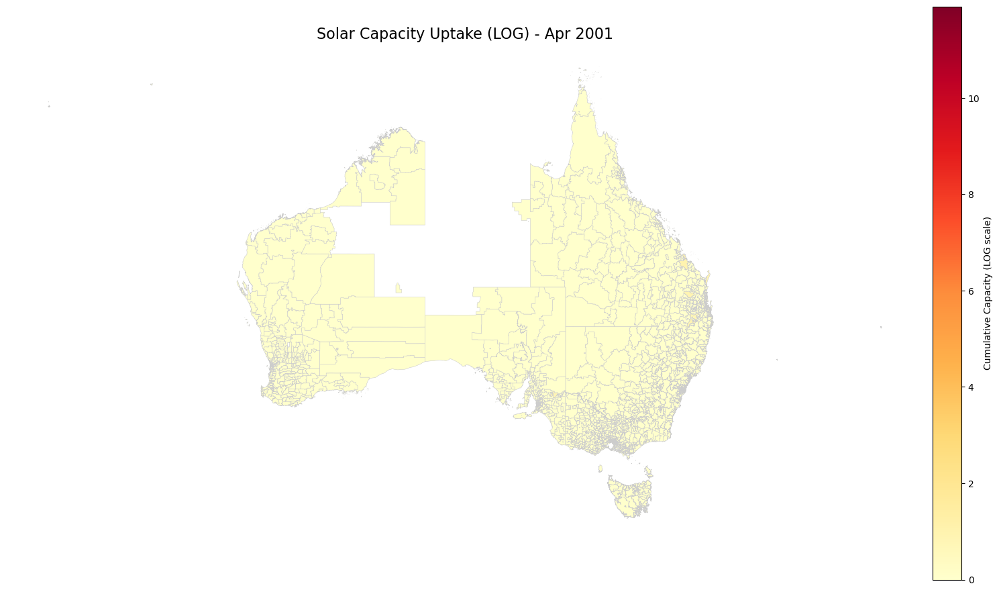

In [18]:
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

# Suppose these are the log-transformed min/max across your monthly columns:
vmin_log = merged_data_log[month_columns_sorted].min().min()
vmax_log = merged_data_log[month_columns_sorted].max().max()

# Plot for the first month (already log-transformed in merged_data_log)
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
merged_data_log.plot(
    column=first_month,          # same name, but now the data is log
    cmap='YlOrRd',
    linewidth=0.4,
    edgecolor='0.8',
    ax=ax,
    vmin=vmin_log,               # use the log-based min/max
    vmax=vmax_log,
    missing_kwds={'color': 'lightgrey'}
)
ax.set_title(f'Solar Capacity Uptake (LOG) - {date_str_first}', fontsize=16)
ax.axis('off')

# Add a colorbar for log values
norm = Normalize(vmin=vmin_log, vmax=vmax_log)
fig.colorbar(
    ScalarMappable(norm=norm, cmap='YlOrRd'),
    ax=ax,
    orientation='vertical',
    fraction=0.03,
    pad=0.01,
    label='Cumulative Capacity (LOG scale)'
)
plt.tight_layout()
plt.show()

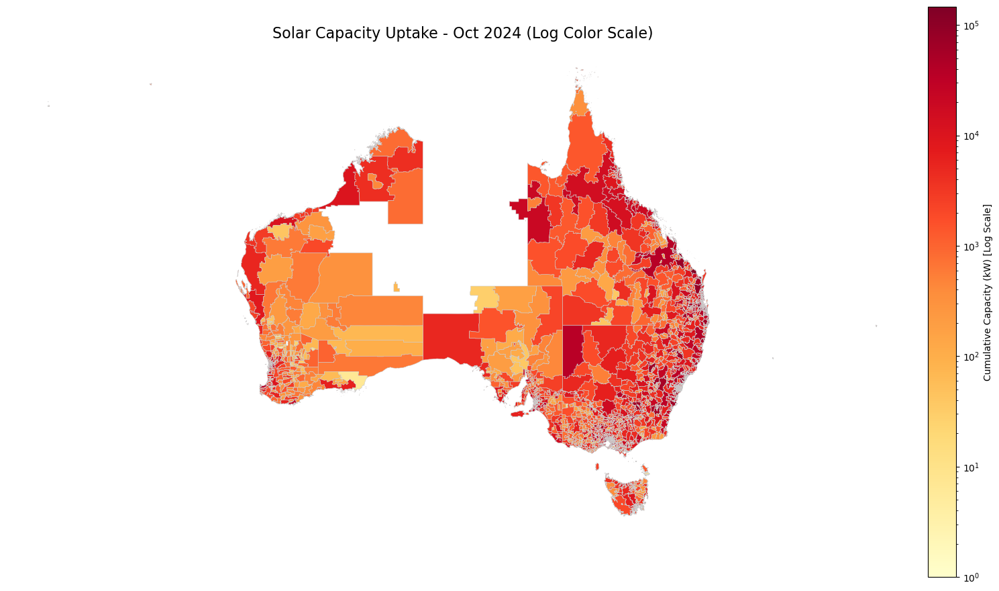

In [19]:
from matplotlib.colors import LogNorm

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

merged_data.plot(
    column=last_month,  
    cmap='YlOrRd',
    linewidth=0.4,
    edgecolor='0.8',
    ax=ax,
    missing_kwds={'color': 'lightgrey'},
    norm=LogNorm(vmin=1, vmax=merged_data[last_month].max())  # Keep vmin > 0 for LogNorm
)

ax.set_title(f'Solar Capacity Uptake - {date_str_last} (Log Color Scale)', fontsize=16)
ax.axis('off')

# Add a log-scale colorbar with LogNorm
cbar = fig.colorbar(
    ScalarMappable(norm=LogNorm(vmin=1, vmax=merged_data[last_month].max()), cmap='YlOrRd'),
    ax=ax,
    orientation='vertical',
    fraction=0.03,
    pad=0.01,
    label='Cumulative Capacity (kW) [Log Scale]'
)

plt.tight_layout()
plt.show()

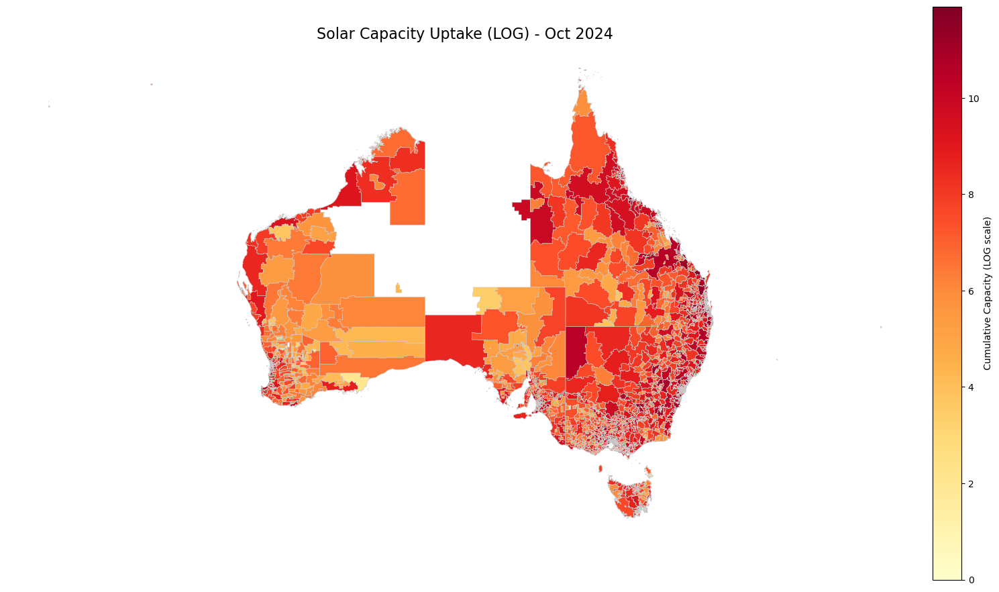

In [20]:
# Plot for the last month (already log-transformed in merged_data_log)
fig, ax = plt.subplots(1, 1, figsize=(15, 10))
merged_data_log.plot(
    column=last_month,       # Use the log-transformed column for the last month
    cmap='YlOrRd',
    linewidth=0.4,
    edgecolor='0.8',
    ax=ax,
    vmin=vmin_log,           # same log-based min
    vmax=vmax_log,           # same log-based max
    missing_kwds={'color': 'lightgrey'}
)
ax.set_title(f'Solar Capacity Uptake (LOG) - {date_str_last}', fontsize=16)
ax.axis('off')

# Add a color bar reflecting the log scale
norm = Normalize(vmin=vmin_log, vmax=vmax_log)
fig.colorbar(
    ScalarMappable(norm=norm, cmap='YlOrRd'),
    ax=ax,
    orientation='vertical',
    fraction=0.03,
    pad=0.01,
    label='Cumulative Capacity (LOG scale)'
)

plt.tight_layout()
plt.show()

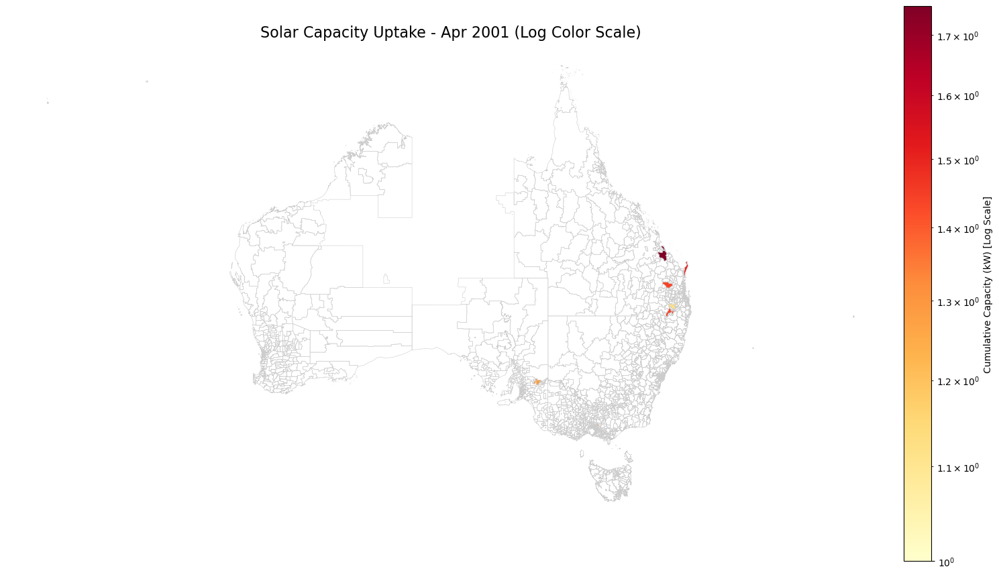

In [21]:
from matplotlib.colors import LogNorm
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

merged_data.plot(
    column=first_month,  
    cmap='YlOrRd',
    linewidth=0.4,
    edgecolor='0.8',
    ax=ax,
    missing_kwds={'color': 'lightgrey'},
    norm=LogNorm(vmin=1, vmax=merged_data[first_month].max())  # Keep vmin > 0 for LogNorm
)

ax.set_title(f'Solar Capacity Uptake - {date_str_first} (Log Color Scale)', fontsize=16)
ax.axis('off')

# Add a log-scale colorbar with LogNorm
cbar = fig.colorbar(
    ScalarMappable(norm=LogNorm(vmin=1, vmax=merged_data[first_month].max()), cmap='YlOrRd'),
    ax=ax,
    orientation='vertical',
    fraction=0.03,
    pad=0.01,
    label='Cumulative Capacity (kW) [Log Scale]'
)

plt.tight_layout()
plt.show()

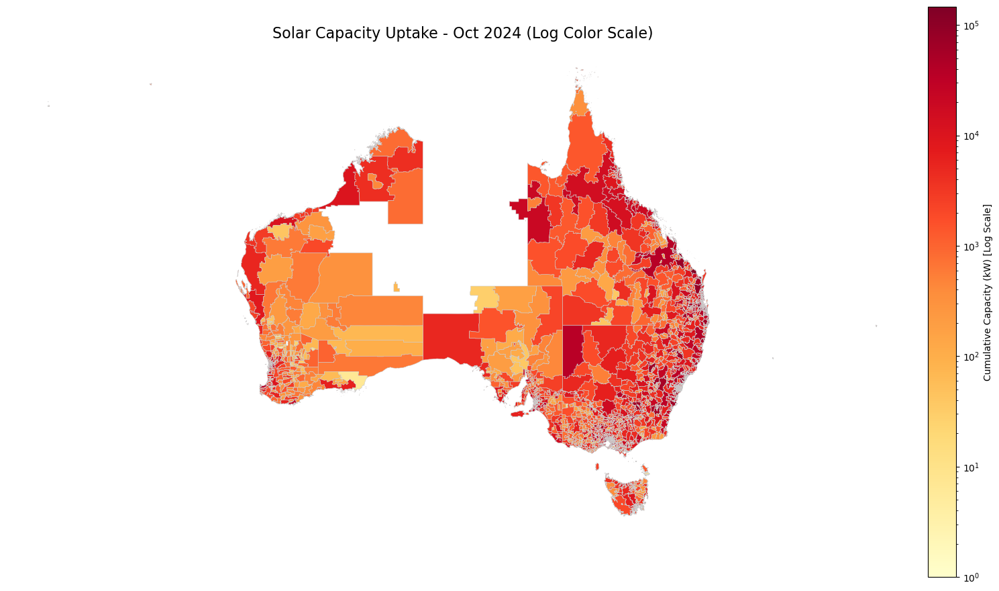

In [22]:
from matplotlib.colors import LogNorm

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

merged_data.plot(
    column=last_month,  
    cmap='YlOrRd',
    linewidth=0.4,
    edgecolor='0.8',
    ax=ax,
    missing_kwds={'color': 'lightgrey'},
    norm=LogNorm(vmin=1, vmax=merged_data[last_month].max())  # Keep vmin > 0 for LogNorm
)

ax.set_title(f'Solar Capacity Uptake - {date_str_last} (Log Color Scale)', fontsize=16)
ax.axis('off')

# Add a log-scale colorbar with LogNorm
cbar = fig.colorbar(
    ScalarMappable(norm=LogNorm(vmin=1, vmax=merged_data[last_month].max()), cmap='YlOrRd'),
    ax=ax,
    orientation='vertical',
    fraction=0.03,
    pad=0.01,
    label='Cumulative Capacity (kW) [Log Scale]'
)

plt.tight_layout()
plt.show()

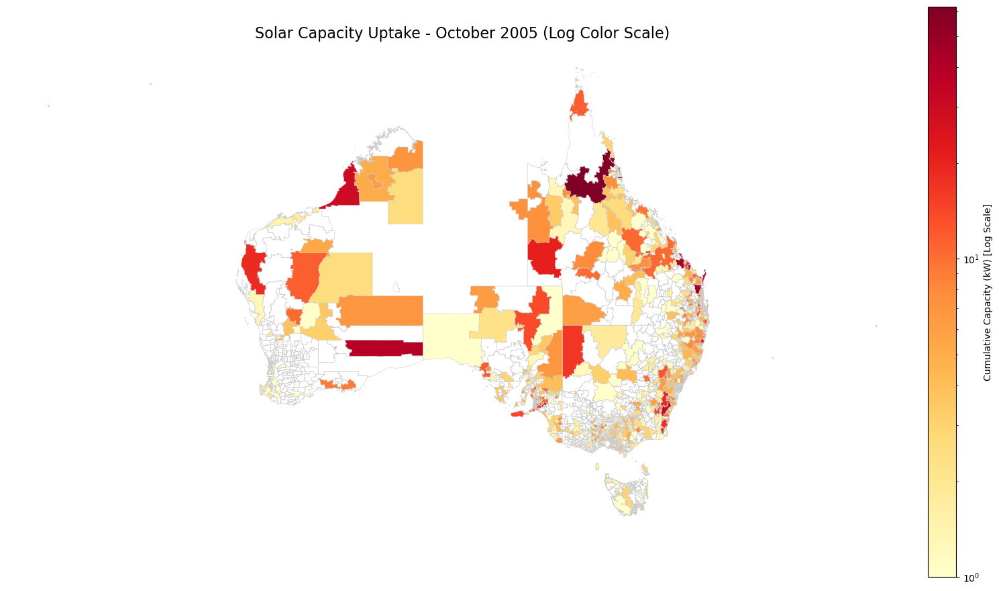

In [23]:
from matplotlib.colors import LogNorm
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable

fig, ax = plt.subplots(1, 1, figsize=(15, 10))

oct_2005 = "Oct 2005 - SGU Rated Output In kW"

merged_data.plot(
    column=oct_2005,  
    cmap='YlOrRd',
    linewidth=0.4,
    edgecolor='0.8',
    ax=ax,
    missing_kwds={'color': 'lightgrey'},
    norm=LogNorm(vmin=1, vmax=merged_data[oct_2005].max())  # Ensure vmin > 0 for LogNorm
)

ax.set_title('Solar Capacity Uptake - October 2005 (Log Color Scale)', fontsize=16)
ax.axis('off')

# Add a log-scale colorbar with LogNorm
cbar = fig.colorbar(
    ScalarMappable(norm=LogNorm(vmin=1, vmax=merged_data[oct_2005].max()), cmap='YlOrRd'),
    ax=ax,
    orientation='vertical',
    fraction=0.03,
    pad=0.01,
    label='Cumulative Capacity (kW) [Log Scale]'
)

plt.tight_layout()
plt.show()

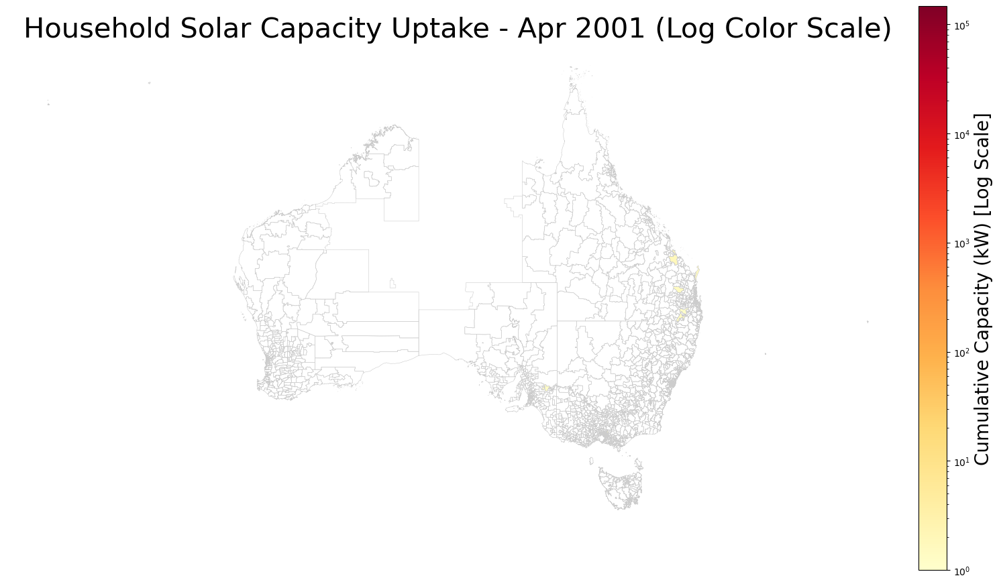

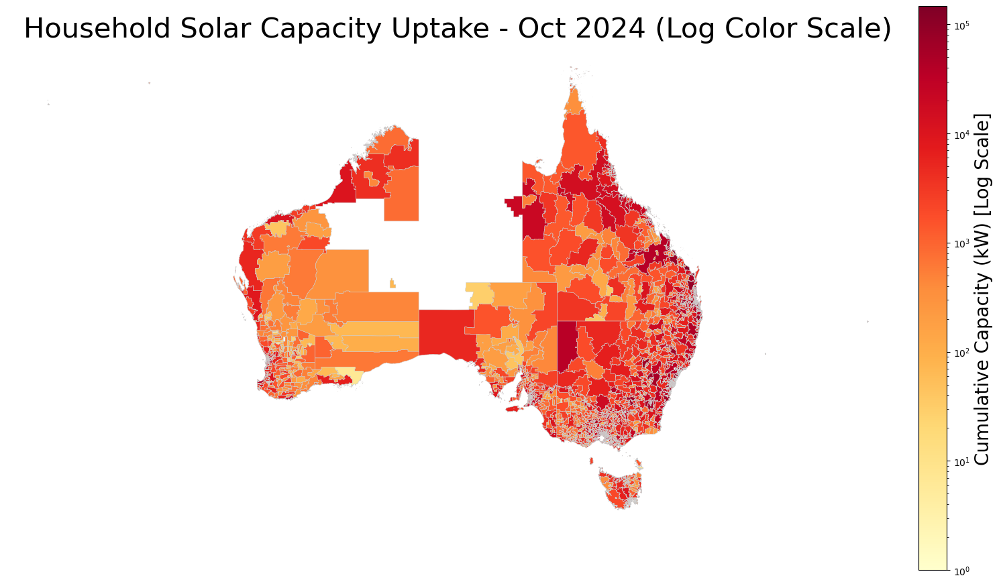

In [26]:
from matplotlib.colors import LogNorm
import matplotlib.pyplot as plt
from matplotlib.cm import ScalarMappable

# Determine the global maximum value across both months
global_max = max(merged_data[first_month].max(), merged_data[last_month].max())

# First plot
fig, ax = plt.subplots(1, 1, figsize=(15, 10))

merged_data.plot(
    column=first_month,
    cmap='YlOrRd',
    linewidth=0.4,
    edgecolor='0.8',
    ax=ax,
    missing_kwds={'color': 'lightgrey'},
    norm=LogNorm(vmin=1, vmax=global_max)  # Use global_max for consistency
)

ax.set_title(f'Household Solar Capacity Uptake - {date_str_first} (Log Color Scale)', fontsize=30)
ax.axis('off')

# Add a log-scale colorbar with LogNorm
cbar = fig.colorbar(
    ScalarMappable(norm=LogNorm(vmin=1, vmax=global_max), cmap='YlOrRd'),
    ax=ax,
    orientation='vertical',
    fraction=0.03,
    pad=0.01,
    label='Cumulative Capacity (kW) [Log Scale]'
)

cbar.ax.set_ylabel('Cumulative Capacity (kW) [Log Scale]', fontsize=20)  # Increased colorbar title size

plt.tight_layout()
plt.show()


# Second plot
fig, ax = plt.subplots(1, 1, figsize=(15, 10))

merged_data.plot(
    column=last_month,
    cmap='YlOrRd',
    linewidth=0.4,
    edgecolor='0.8',
    ax=ax,
    missing_kwds={'color': 'lightgrey'},
    norm=LogNorm(vmin=1, vmax=global_max)  # Again, use global_max
)

ax.set_title(f'Household Solar Capacity Uptake - {date_str_last} (Log Color Scale)', fontsize=30)
ax.axis('off')

# Add a log-scale colorbar with LogNorm
cbar = fig.colorbar(
    ScalarMappable(norm=LogNorm(vmin=1, vmax=global_max), cmap='YlOrRd'),
    ax=ax,
    orientation='vertical',
    fraction=0.03,
    pad=0.01,
    label='Cumulative Capacity (kW) [Log Scale]'
)

cbar.ax.set_ylabel('Cumulative Capacity (kW) [Log Scale]', fontsize=20)  # Increased colorbar title size

plt.tight_layout()
plt.show()

In [25]:
import os
import glob

# Get a list of all .png files in the current directory
png_files = glob.glob("*.png")
print("Deleting the following files:", png_files)

# Loop through and remove each file
for file in png_files:
    os.remove(file)
    print(f"Deleted: {file}")

Deleting the following files: []
